In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/rgb-eurosat/EuroSAT/validation.csv
/kaggle/input/rgb-eurosat/EuroSAT/train.csv
/kaggle/input/rgb-eurosat/EuroSAT/test.csv
/kaggle/input/rgb-eurosat/EuroSAT/label_map.json
/kaggle/input/rgb-eurosat/EuroSAT/Green/Forest_2838.jpg
/kaggle/input/rgb-eurosat/EuroSAT/Green/AnnualCrop_1184.jpg
/kaggle/input/rgb-eurosat/EuroSAT/Green/HerbaceousVegetation_1224.jpg
/kaggle/input/rgb-eurosat/EuroSAT/Green/HerbaceousVegetation_1712.jpg
/kaggle/input/rgb-eurosat/EuroSAT/Green/Pasture_1489.jpg
/kaggle/input/rgb-eurosat/EuroSAT/Green/Pasture_857.jpg
/kaggle/input/rgb-eurosat/EuroSAT/Green/AnnualCrop_1932.jpg
/kaggle/input/rgb-eurosat/EuroSAT/Green/PermanentCrop_686.jpg
/kaggle/input/rgb-eurosat/EuroSAT/Green/Pasture_1167.jpg
/kaggle/input/rgb-eurosat/EuroSAT/Green/Pasture_129.jpg
/kaggle/input/rgb-eurosat/EuroSAT/Green/HerbaceousVegetation_1604.jpg
/kaggle/input/rgb-eurosat/EuroSAT/Green/AnnualCrop_2213.jpg
/kaggle/input/rgb-eurosat/EuroSAT/Green/Forest_205.jpg
/kaggle/input/rgb-eurosat/

In [2]:


import os
import shutil
#from osgeo import gdal
import matplotlib.pyplot as plt
import zipfile
%matplotlib inline

# For using operating system functionality
import pathlib
import os

#for numerical and tabular data handling
import numpy as np
import pandas as pd

#for data visualization
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

#for image processing
import PIL
import cv2

#specifically for neural network
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

from sklearn.metrics import cohen_kappa_score

In [3]:
data_dir= pathlib.Path('../input/rgb-eurosat/EuroSAT')

In [4]:
total_images= len(list(data_dir.glob('*/*.jpg')))
print("Total images in RGB bands are: ", total_images)

Total images in RGB bands are:  27000


In [5]:
batch_size=64
img_height=64
img_width= 64

In [6]:
train_ds= tf.keras.preprocessing.image_dataset_from_directory(data_dir,
                                                             seed=123,
                                                             validation_split= 0.25,
                                                             subset= 'training',
                                                             image_size=(img_height, img_width),
                                                             batch_size=batch_size)

Found 27000 files belonging to 3 classes.
Using 20250 files for training.


2022-06-08 09:45:43.856301: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-06-08 09:45:43.971636: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-06-08 09:45:43.972669: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-06-08 09:45:43.975578: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

In [7]:
train_ds.class_names

['BuiltUp', 'Green', 'Water']

In [8]:
valid_ds= tf.keras.preprocessing.image_dataset_from_directory(data_dir,
                                                             seed= 123,
                                                             validation_split= 0.25,
                                                             subset= 'validation',
                                                             image_size= (img_height, img_width),
                                                             batch_size=batch_size)

Found 27000 files belonging to 3 classes.
Using 6750 files for validation.


In [9]:
class_Names= train_ds.class_names
print("Total classes are: ", len(class_Names))
print(class_Names)

Total classes are:  3
['BuiltUp', 'Green', 'Water']


In [10]:
AUTOTUNE= tf.data.experimental.AUTOTUNE
train_ds= train_ds.cache().shuffle(500).prefetch(buffer_size=AUTOTUNE)
valid_ds= valid_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [11]:
num_classes= len(class_Names)

model = Sequential([
    layers.experimental.preprocessing.Rescaling(1./255, input_shape= (img_height, img_width, 3)),
    layers.Conv2D(32,3, padding='same', activation= 'relu'),
    layers.MaxPool2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPool2D(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.MaxPool2D(),
    layers.Dropout(0.3),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

In [12]:
model.compile(optimizer='adam',
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits= True),
             metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 64, 64, 3)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 64, 64, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 8, 8, 128)         0

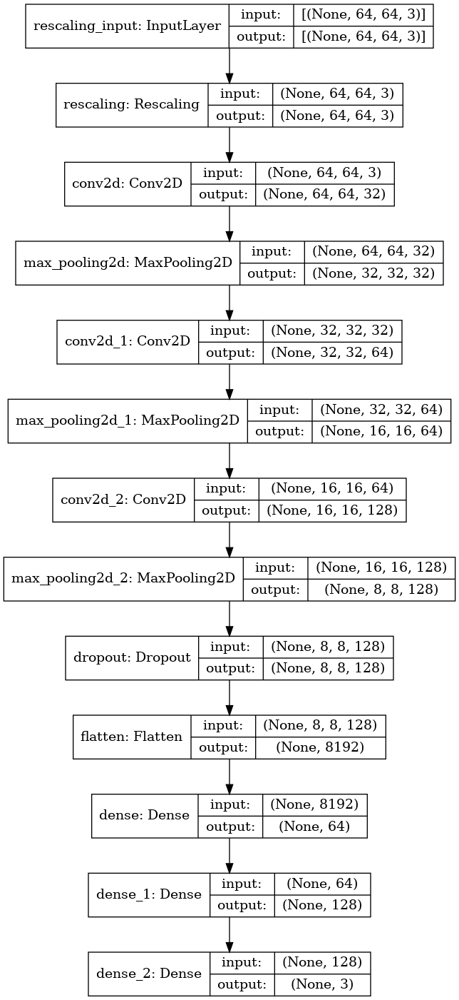

In [13]:
tf.keras.utils.plot_model(model=model, show_shapes=True, show_layer_names=True, to_file= 'custom.png')

In [14]:
epochs= 20
history= model.fit(train_ds, validation_data=valid_ds, epochs=epochs, verbose=1)

Epoch 1/20


2022-06-08 09:45:53.965343: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-06-08 09:46:04.158061: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 70 of 500
2022-06-08 09:46:14.185925: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 152 of 500
2022-06-08 09:46:24.088095: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 229 of 500
2022-06-08 09:46:34.123417: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 308 of 500
2022-06-08 09:46:34.186850: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.
2022-06-08 09:46:34.856817: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


317/317 [==============================] - 63s 50ms/step - loss: 0.6396 - accuracy: 0.7137 - val_loss: 0.4637 - val_accuracy: 0.8067
Epoch 2/20
317/317 [==============================] - 2s 7ms/step - loss: 0.4594 - accuracy: 0.8105 - val_loss: 0.4401 - val_accuracy: 0.8166
Epoch 3/20
317/317 [==============================] - 2s 7ms/step - loss: 0.3876 - accuracy: 0.8450 - val_loss: 0.3244 - val_accuracy: 0.8705
Epoch 4/20
317/317 [==============================] - 2s 7ms/step - loss: 0.3361 - accuracy: 0.8691 - val_loss: 0.2958 - val_accuracy: 0.8785
Epoch 5/20
317/317 [==============================] - 2s 8ms/step - loss: 0.3013 - accuracy: 0.8848 - val_loss: 0.3039 - val_accuracy: 0.8754
Epoch 6/20
317/317 [==============================] - 2s 7ms/step - loss: 0.2640 - accuracy: 0.8993 - val_loss: 0.2349 - val_accuracy: 0.9092
Epoch 7/20
317/317 [==============================] - 2s 8ms/step - loss: 0.2417 - accuracy: 0.9098 - val_loss: 0.2563 - val_accuracy: 0.9079
Epoch 8/20
317/

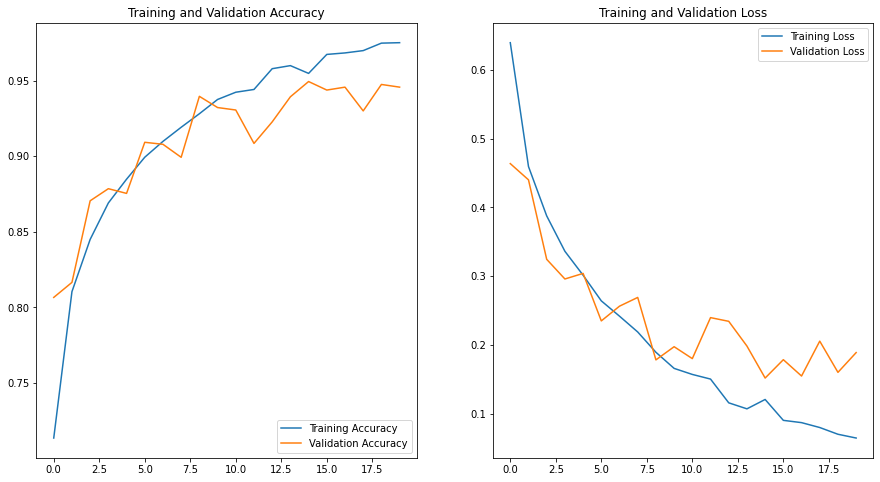

In [15]:
#Visualizing the results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.savefig('custom_acc_loss1.png')
plt.show()


In [16]:
# get all testing images as NumPy array
images = np.array([ d[0][0] for d in valid_ds.take(200) ])
print("images.shape:", images.shape)

images.shape: (106, 64, 64, 3)


In [17]:
# get all testing labels as NumPy array
labels = np.array([ d[1][0] for d in valid_ds.take(200) ])

print("labels.shape:", labels.shape)

labels.shape: (106,)


In [18]:
# feed the images to get predictions
predictions = model.predict(images)
# perform argmax to get class index
predictions = np.argmax(predictions, axis=1)
print("predictions.shape:", predictions.shape)

predictions.shape: (106,)


In [19]:
from sklearn.metrics import f1_score

accuracy = tf.keras.metrics.Accuracy()
accuracy.update_state(labels, predictions)
print("Accuracy:", accuracy.result().numpy())
print("F1 Score:", f1_score(labels, predictions, average="macro"))
print('Kappa Score: ', cohen_kappa_score(labels, predictions))

Accuracy: 0.9433962
F1 Score: 0.9261627906976745
Kappa Score:  0.9072886297376094


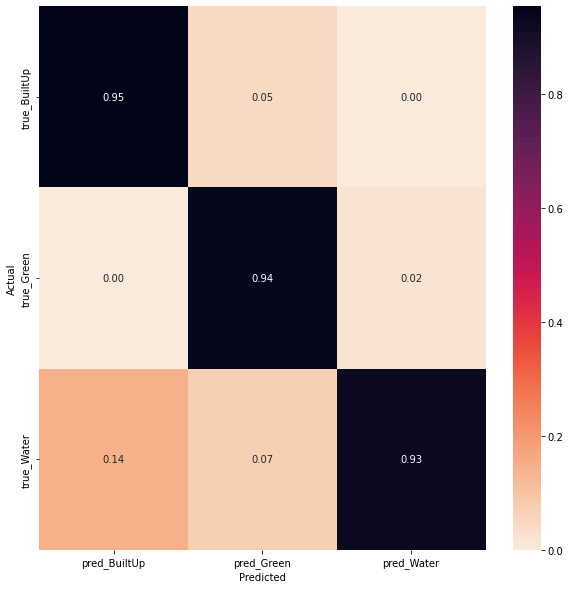

In [20]:
# compute the confusion matrix
cmn = tf.math.confusion_matrix(labels, predictions).numpy()
# normalize the matrix to be in percentages
cmn = cmn.astype('float') / cmn.sum(axis=0)[:, np.newaxis]
# make a plot for the confusion matrix
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', 
            xticklabels=[f"pred_{c}" for c in class_Names], 
            yticklabels=[f"true_{c}" for c in class_Names],
            # cmap="Blues"
            cmap="rocket_r"
            )
plt.ylabel('Actual')
plt.xlabel('Predicted')
# plot the resulting confusion matrix
plt.savefig("confusion-matrix_custom.png")
# plt.show()

In [21]:
#import pickle
#pickle.dump(model, open('./CNN_model.pkl', 'wb'))

### Custom CNN model
Accuracy- 94.34%
F1 Score- 93.51%

### EfficientNet B0

In [22]:
img_shape=[64, 64]
from tensorflow.keras.applications import EfficientNetB0
effmodel_b0= EfficientNetB0(input_shape= img_shape + [3], weights= 'imagenet', include_top=False)

for layer in effmodel_b0.layers:
  layer.trainable=False

16719872/16705208 [==============================] - 0s 0us/step


In [23]:
effmodel_b0.summary()

Model: "efficientnetb0"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
rescaling_1 (Rescaling)         (None, 64, 64, 3)    0           input_1[0][0]                    
__________________________________________________________________________________________________
normalization (Normalization)   (None, 64, 64, 3)    7           rescaling_1[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 65, 65, 3)    0           normalization[0][0]              
_____________________________________________________________________________________

In [24]:
from keras.layers import Flatten, Dense, Lambda
from keras.models import Model
x= Flatten()(effmodel_b0.output)
x1= Dense(64, activation='relu')(x)
x2= Dense(128, activation='relu')(x1)

In [25]:
from keras.engine.training import Model
prediction= Dense(len(class_Names))(x2)
effmodel_b0= Model(inputs= effmodel_b0.input, outputs = prediction)

In [26]:
effmodel_b0.compile(optimizer= 'adam',
                  loss= tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  metrics=['accuracy'])

In [27]:
effmodel_b0.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
rescaling_1 (Rescaling)         (None, 64, 64, 3)    0           input_1[0][0]                    
__________________________________________________________________________________________________
normalization (Normalization)   (None, 64, 64, 3)    7           rescaling_1[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 65, 65, 3)    0           normalization[0][0]              
______________________________________________________________________________________________

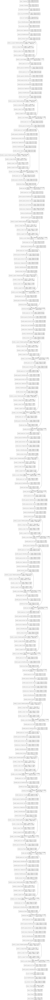

In [28]:
tf.keras.utils.plot_model(model=effmodel_b0, show_shapes=True, show_layer_names=True, to_file= 'bo.png')

In [29]:
epochs= 20
history= effmodel_b0.fit(train_ds, validation_data=valid_ds, epochs=epochs, verbose=1)

Epoch 1/20
317/317 [==============================] - 12s 25ms/step - loss: 0.2143 - accuracy: 0.9198 - val_loss: 0.1549 - val_accuracy: 0.9450
Epoch 2/20
317/317 [==============================] - 7s 21ms/step - loss: 0.1280 - accuracy: 0.9529 - val_loss: 0.1327 - val_accuracy: 0.9547
Epoch 3/20
317/317 [==============================] - 7s 21ms/step - loss: 0.1027 - accuracy: 0.9622 - val_loss: 0.1402 - val_accuracy: 0.9505
Epoch 4/20
317/317 [==============================] - 6s 20ms/step - loss: 0.0881 - accuracy: 0.9675 - val_loss: 0.1315 - val_accuracy: 0.9559
Epoch 5/20
317/317 [==============================] - 7s 21ms/step - loss: 0.0755 - accuracy: 0.9718 - val_loss: 0.1363 - val_accuracy: 0.9563
Epoch 6/20
317/317 [==============================] - 7s 21ms/step - loss: 0.0641 - accuracy: 0.9769 - val_loss: 0.1308 - val_accuracy: 0.9578
Epoch 7/20
317/317 [==============================] - 7s 21ms/step - loss: 0.0570 - accuracy: 0.9800 - val_loss: 0.1776 - val_accuracy: 0.952

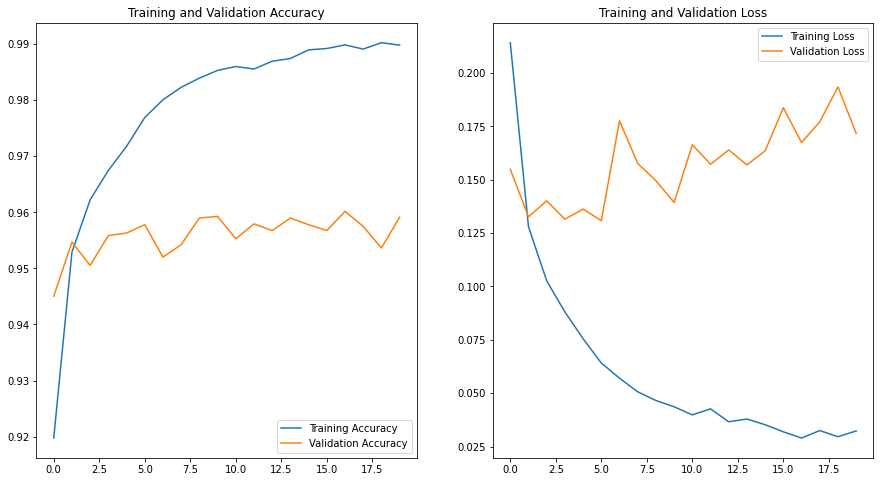

In [30]:
#Visualizing the results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.savefig('b0_acc_loss.png')
plt.show()

In [31]:
# get all testing images as NumPy array
images = np.array([ d[0][0] for d in valid_ds.take(200) ])
print("images.shape:", images.shape)

images.shape: (106, 64, 64, 3)


In [32]:
# get all testing labels as NumPy array
labels = np.array([ d[1][0] for d in valid_ds.take(200) ])

print("labels.shape:", labels.shape)

labels.shape: (106,)


In [33]:
# feed the images to get predictions
predictions = effmodel_b0.predict(images)
# perform argmax to get class index
predictions = np.argmax(predictions, axis=1)
print("predictions.shape:", predictions.shape)

predictions.shape: (106,)


In [34]:
from sklearn.metrics import f1_score

accuracy = tf.keras.metrics.Accuracy()
accuracy.update_state(labels, predictions)
print("Accuracy:", accuracy.result().numpy())
print("F1 Score:", f1_score(labels, predictions, average="macro"))
print('Kappa Score: ', cohen_kappa_score(labels, predictions))

Accuracy: 0.9150943
F1 Score: 0.9013523541259674
Kappa Score:  0.8628719275549805


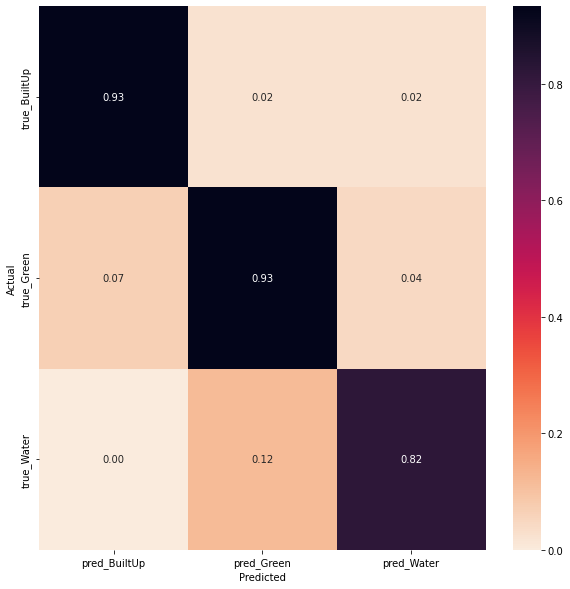

In [35]:
# compute the confusion matrix
cmn = tf.math.confusion_matrix(labels, predictions).numpy()
# normalize the matrix to be in percentages
cmn = cmn.astype('float') / cmn.sum(axis=0)[:, np.newaxis]
# make a plot for the confusion matrix
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', 
            xticklabels=[f"pred_{c}" for c in class_Names], 
            yticklabels=[f"true_{c}" for c in class_Names],
            # cmap="Blues"
            cmap="rocket_r"
            )
plt.ylabel('Actual')
plt.xlabel('Predicted')
# plot the resulting confusion matrix
plt.savefig("confusion-matrix_b0.png")
# plt.show()

### Custom EfficientNet B0 model
Accuracy- 93.4%
F1 Score- 92.9%

In [36]:
#import pickle
#pickle.dump(model, open('./effmodel_b0.pkl', 'wb'))

### EfficientNet B1

In [37]:
img_shape=[64, 64]
from tensorflow.keras.applications import EfficientNetB1
effmodel_b1= EfficientNetB1(input_shape= img_shape + [3], weights= 'imagenet', include_top=False)

for layer in effmodel_b1.layers:
  layer.trainable=False

27033600/27018416 [==============================] - 1s 0us/step


In [38]:
effmodel_b1.summary()

Model: "efficientnetb1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
rescaling_2 (Rescaling)         (None, 64, 64, 3)    0           input_2[0][0]                    
__________________________________________________________________________________________________
normalization_1 (Normalization) (None, 64, 64, 3)    7           rescaling_2[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 65, 65, 3)    0           normalization_1[0][0]            
_____________________________________________________________________________________

In [39]:
from keras.layers import Flatten, Dense, Lambda
from keras.models import Model
x= Flatten()(effmodel_b1.output)
x1= Dense(64, activation='relu')(x)
x2= Dense(128, activation='relu')(x1)

In [40]:
from keras.engine.training import Model
prediction= Dense(len(class_Names))(x2)
effmodel_b1= Model(inputs= effmodel_b1.input, outputs = prediction)

In [41]:
effmodel_b1.compile(optimizer= 'adam',
                  loss= tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  metrics=['accuracy'])

In [42]:
effmodel_b1.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
rescaling_2 (Rescaling)         (None, 64, 64, 3)    0           input_2[0][0]                    
__________________________________________________________________________________________________
normalization_1 (Normalization) (None, 64, 64, 3)    7           rescaling_2[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 65, 65, 3)    0           normalization_1[0][0]            
____________________________________________________________________________________________

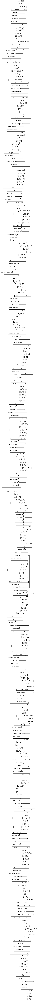

In [43]:
tf.keras.utils.plot_model(model=effmodel_b1, show_shapes=True, show_layer_names=True, to_file= 'b1.png')

In [44]:
epochs= 20
history= effmodel_b1.fit(train_ds, validation_data=valid_ds, epochs=epochs, verbose=1)

Epoch 1/20
317/317 [==============================] - 17s 33ms/step - loss: 0.2518 - accuracy: 0.9036 - val_loss: 0.1794 - val_accuracy: 0.9327
Epoch 2/20
317/317 [==============================] - 9s 27ms/step - loss: 0.1544 - accuracy: 0.9419 - val_loss: 0.1414 - val_accuracy: 0.9479
Epoch 3/20
317/317 [==============================] - 9s 28ms/step - loss: 0.1307 - accuracy: 0.9517 - val_loss: 0.1499 - val_accuracy: 0.9483
Epoch 4/20
317/317 [==============================] - 9s 29ms/step - loss: 0.1110 - accuracy: 0.9577 - val_loss: 0.1490 - val_accuracy: 0.9459
Epoch 5/20
317/317 [==============================] - 9s 28ms/step - loss: 0.0987 - accuracy: 0.9638 - val_loss: 0.1511 - val_accuracy: 0.9524
Epoch 6/20
317/317 [==============================] - 9s 28ms/step - loss: 0.0880 - accuracy: 0.9680 - val_loss: 0.1551 - val_accuracy: 0.9496
Epoch 7/20
317/317 [==============================] - 9s 28ms/step - loss: 0.0796 - accuracy: 0.9711 - val_loss: 0.1604 - val_accuracy: 0.947

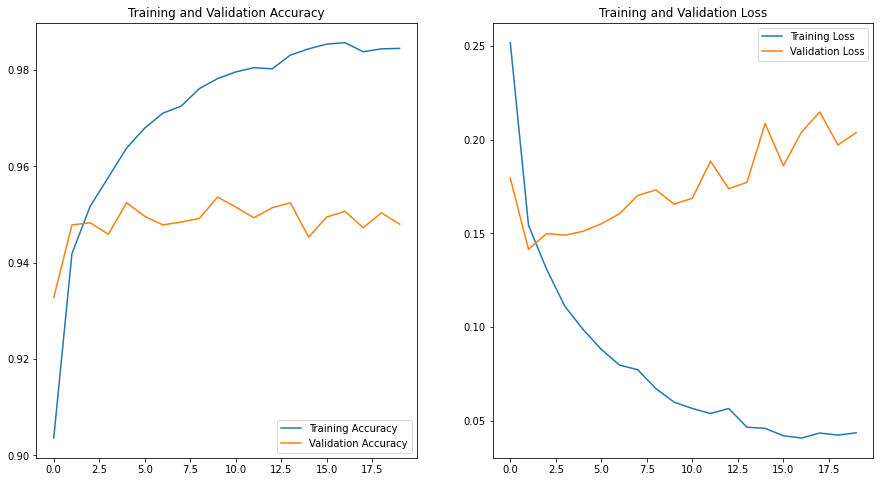

In [45]:
#Visualizing the results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.savefig('b1_acc_loss.png')
plt.show()

In [46]:
# feed the images to get predictions
predictions = effmodel_b1.predict(images)
# perform argmax to get class index
predictions = np.argmax(predictions, axis=1)
print("predictions.shape:", predictions.shape)

predictions.shape: (106,)


In [47]:
from sklearn.metrics import f1_score

accuracy = tf.keras.metrics.Accuracy()
accuracy.update_state(labels, predictions)
print("Accuracy:", accuracy.result().numpy())
print("F1 Score:", f1_score(labels, predictions, average="macro"))
print('Kappa Score: ', cohen_kappa_score(labels, predictions))

Accuracy: 0.9716981
F1 Score: 0.9713943637424508
Kappa Score:  0.9542643463253272


### Efficient B1 model
Accuracy- 96.22%
F1 Score- 94.97%

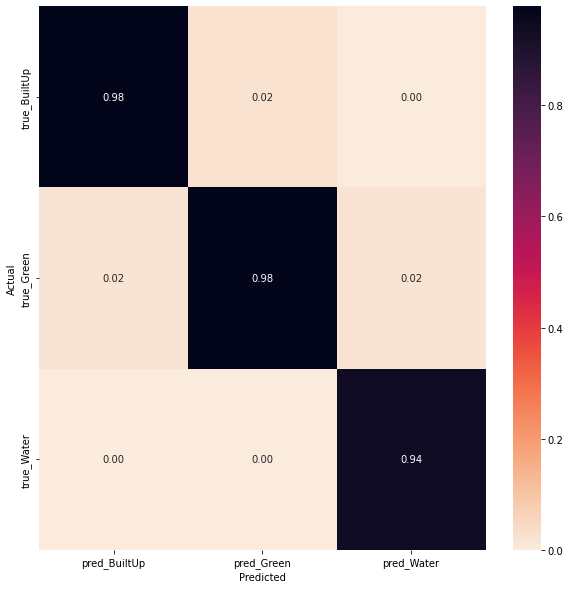

In [48]:
# compute the confusion matrix
cmn = tf.math.confusion_matrix(labels, predictions).numpy()
# normalize the matrix to be in percentages
cmn = cmn.astype('float') / cmn.sum(axis=0)[:, np.newaxis]
# make a plot for the confusion matrix
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', 
            xticklabels=[f"pred_{c}" for c in class_Names], 
            yticklabels=[f"true_{c}" for c in class_Names],
            # cmap="Blues"
            cmap="rocket_r"
            )
plt.ylabel('Actual')
plt.xlabel('Predicted')
# plot the resulting confusion matrix
plt.savefig("confusion-matrix_b1.png")
# plt.show()

### EfficientNet B3

In [49]:
img_shape=[64, 64]
from tensorflow.keras.applications import EfficientNetB3
effmodel_b3= EfficientNetB3(input_shape= img_shape + [3], weights= 'imagenet', include_top=False)

for layer in effmodel_b3.layers:
  layer.trainable=False

43950080/43941136 [==============================] - 0s 0us/step


In [50]:
effmodel_b3.summary()

Model: "efficientnetb3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
rescaling_3 (Rescaling)         (None, 64, 64, 3)    0           input_3[0][0]                    
__________________________________________________________________________________________________
normalization_2 (Normalization) (None, 64, 64, 3)    7           rescaling_3[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 65, 65, 3)    0           normalization_2[0][0]            
_____________________________________________________________________________________

In [51]:
from keras.layers import Flatten, Dense, Lambda
from keras.models import Model
x= Flatten()(effmodel_b3.output)
x1= Dense(64, activation='relu')(x)
x2= Dense(128, activation='relu')(x1)

In [52]:
from keras.engine.training import Model
prediction= Dense(len(class_Names))(x2)
effmodel_b3= Model(inputs= effmodel_b3.input, outputs = prediction)

In [53]:
effmodel_b3.compile(optimizer= 'adam',
                  loss= tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  metrics=['accuracy'])

In [54]:
effmodel_b3.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
rescaling_3 (Rescaling)         (None, 64, 64, 3)    0           input_3[0][0]                    
__________________________________________________________________________________________________
normalization_2 (Normalization) (None, 64, 64, 3)    7           rescaling_3[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 65, 65, 3)    0           normalization_2[0][0]            
____________________________________________________________________________________________

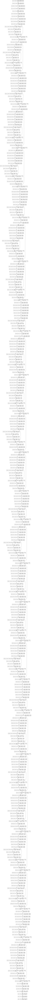

In [55]:
tf.keras.utils.plot_model(model=effmodel_b3, show_shapes=True, show_layer_names=True, to_file= 'b3.png')

In [56]:
epochs= 20
history= effmodel_b3.fit(train_ds, validation_data=valid_ds, epochs=epochs, verbose=1)

Epoch 1/20
317/317 [==============================] - 22s 45ms/step - loss: 0.2429 - accuracy: 0.9084 - val_loss: 0.2152 - val_accuracy: 0.9256
Epoch 2/20
317/317 [==============================] - 12s 37ms/step - loss: 0.1518 - accuracy: 0.9430 - val_loss: 0.1383 - val_accuracy: 0.9505
Epoch 3/20
317/317 [==============================] - 12s 38ms/step - loss: 0.1292 - accuracy: 0.9527 - val_loss: 0.1322 - val_accuracy: 0.9514
Epoch 4/20
317/317 [==============================] - 12s 37ms/step - loss: 0.1131 - accuracy: 0.9585 - val_loss: 0.1246 - val_accuracy: 0.9551
Epoch 5/20
317/317 [==============================] - 12s 37ms/step - loss: 0.1082 - accuracy: 0.9588 - val_loss: 0.1291 - val_accuracy: 0.9520
Epoch 6/20
317/317 [==============================] - 12s 37ms/step - loss: 0.0959 - accuracy: 0.9643 - val_loss: 0.1306 - val_accuracy: 0.9564
Epoch 7/20
317/317 [==============================] - 12s 37ms/step - loss: 0.0863 - accuracy: 0.9670 - val_loss: 0.1301 - val_accuracy:

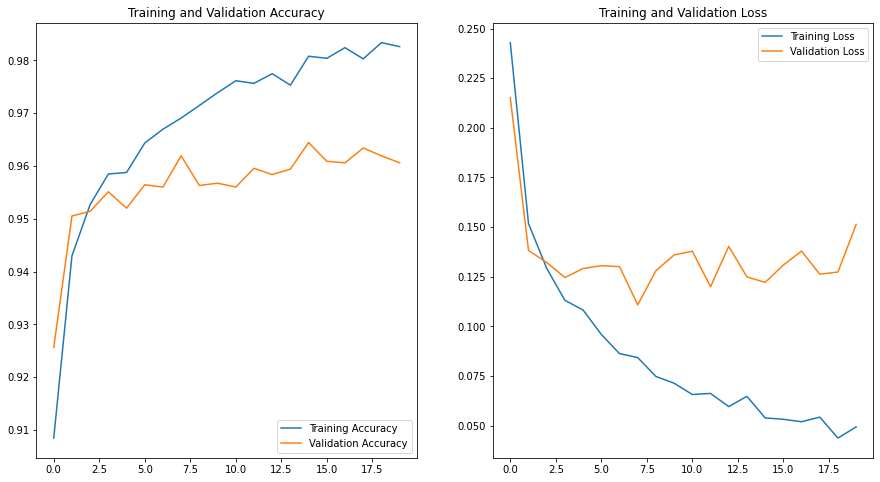

In [57]:
#Visualizing the results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.savefig('b3_acc_loss.png')
plt.show()

In [58]:
# feed the images to get predictions
predictions = effmodel_b3.predict(images)
# perform argmax to get class index
predictions = np.argmax(predictions, axis=1)
print("predictions.shape:", predictions.shape)

predictions.shape: (106,)


In [59]:
from sklearn.metrics import f1_score

accuracy = tf.keras.metrics.Accuracy()
accuracy.update_state(labels, predictions)
print("Accuracy:", accuracy.result().numpy())
print("F1 Score:", f1_score(labels, predictions, average="macro"))
print('Kappa Score: ', cohen_kappa_score(labels, predictions))

Accuracy: 0.9622642
F1 Score: 0.9557037935449094
Kappa Score:  0.9381563593932322


### Efficient B3 model
Accuracy- 97.16%
F1 Score- 95.86%

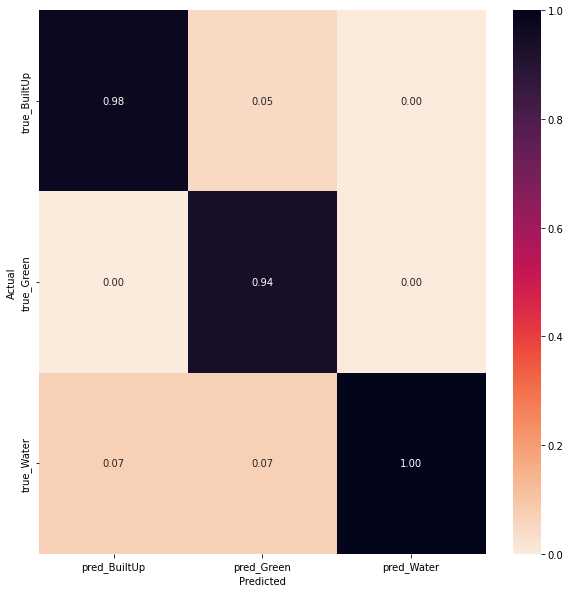

In [60]:
# compute the confusion matrix
cmn = tf.math.confusion_matrix(labels, predictions).numpy()
# normalize the matrix to be in percentages
cmn = cmn.astype('float') / cmn.sum(axis=0)[:, np.newaxis]
# make a plot for the confusion matrix
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', 
            xticklabels=[f"pred_{c}" for c in class_Names], 
            yticklabels=[f"true_{c}" for c in class_Names],
            # cmap="Blues"
            cmap="rocket_r"
            )
plt.ylabel('Actual')
plt.xlabel('Predicted')
# plot the resulting confusion matrix
plt.savefig("confusion-matrix_b3.png")
# plt.show()

### EfficientNet B7

In [61]:
img_shape=[64, 64]
from tensorflow.keras.applications import EfficientNetB7
effmodel_b7= EfficientNetB7(input_shape= img_shape + [3], weights= 'imagenet', include_top=False)

for layer in effmodel_b7.layers:
  layer.trainable=False

258088960/258076736 [==============================] - 2s 0us/step


In [62]:
effmodel_b7.summary()

Model: "efficientnetb7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
rescaling_4 (Rescaling)         (None, 64, 64, 3)    0           input_4[0][0]                    
__________________________________________________________________________________________________
normalization_3 (Normalization) (None, 64, 64, 3)    7           rescaling_4[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 65, 65, 3)    0           normalization_3[0][0]            
_____________________________________________________________________________________

In [63]:
from keras.layers import Flatten, Dense, Lambda
from keras.models import Model
x= Flatten()(effmodel_b7.output)
x1= Dense(64, activation='relu')(x)
x2= Dense(128, activation='relu')(x1)

In [64]:
from keras.engine.training import Model
prediction= Dense(len(class_Names))(x2)
effmodel_b7= Model(inputs= effmodel_b7.input, outputs = prediction)

In [65]:
effmodel_b7.compile(optimizer= 'adam',
                  loss= tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  metrics=['accuracy'])

In [66]:
effmodel_b7.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
rescaling_4 (Rescaling)         (None, 64, 64, 3)    0           input_4[0][0]                    
__________________________________________________________________________________________________
normalization_3 (Normalization) (None, 64, 64, 3)    7           rescaling_4[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 65, 65, 3)    0           normalization_3[0][0]            
____________________________________________________________________________________________

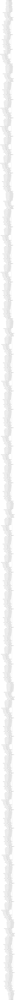

In [67]:
tf.keras.utils.plot_model(model=effmodel_b7, show_shapes=True, show_layer_names=True, to_file= 'b7.png')

In [68]:
epochs= 20
history= effmodel_b7.fit(train_ds, validation_data=valid_ds, epochs=epochs, verbose=1)

Epoch 1/20
317/317 [==============================] - 58s 132ms/step - loss: 0.7040 - accuracy: 0.7024 - val_loss: 0.3491 - val_accuracy: 0.8724
Epoch 2/20
317/317 [==============================] - 37s 116ms/step - loss: 0.4034 - accuracy: 0.8439 - val_loss: 0.5537 - val_accuracy: 0.8000
Epoch 3/20
317/317 [==============================] - 36s 115ms/step - loss: 0.3504 - accuracy: 0.8659 - val_loss: 0.2713 - val_accuracy: 0.8933
Epoch 4/20
317/317 [==============================] - 37s 117ms/step - loss: 0.3425 - accuracy: 0.8693 - val_loss: 0.3897 - val_accuracy: 0.8606
Epoch 5/20
317/317 [==============================] - 37s 116ms/step - loss: 0.3348 - accuracy: 0.8730 - val_loss: 0.2889 - val_accuracy: 0.9027
Epoch 6/20
317/317 [==============================] - 37s 115ms/step - loss: 0.3325 - accuracy: 0.8737 - val_loss: 0.2437 - val_accuracy: 0.9116
Epoch 7/20
317/317 [==============================] - 37s 116ms/step - loss: 0.3106 - accuracy: 0.8808 - val_loss: 0.2658 - val_ac

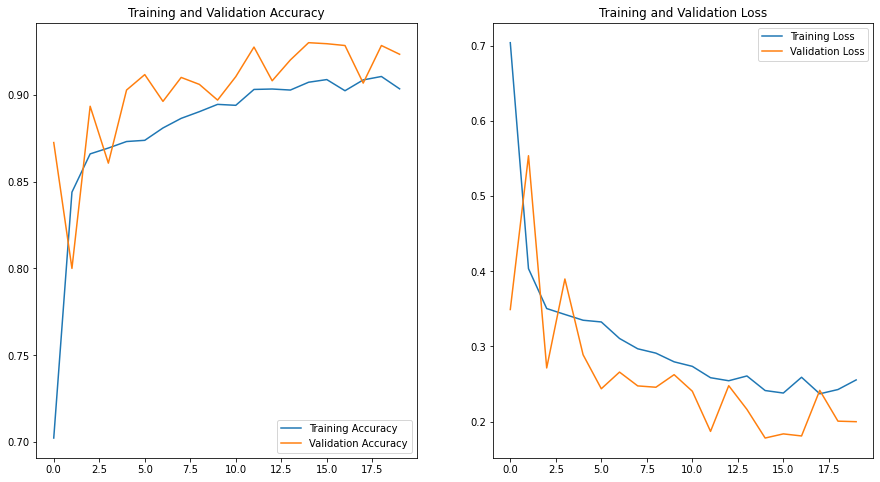

In [69]:
#Visualizing the results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.savefig('b7_acc_loss.png')
plt.show()

In [70]:
# feed the images to get predictions
predictions = effmodel_b7.predict(images)
# perform argmax to get class index
predictions = np.argmax(predictions, axis=1)
print("predictions.shape:", predictions.shape)

predictions.shape: (106,)


In [71]:
from sklearn.metrics import f1_score

accuracy = tf.keras.metrics.Accuracy()
accuracy.update_state(labels, predictions)
print("Accuracy:", accuracy.result().numpy())
print("F1 Score:", f1_score(labels, predictions, average="macro"))

Accuracy: 0.8773585
F1 Score: 0.8612105711849957


### Efficient B7 model
Accuracy- 88.67%
F1 Score- 86.16%

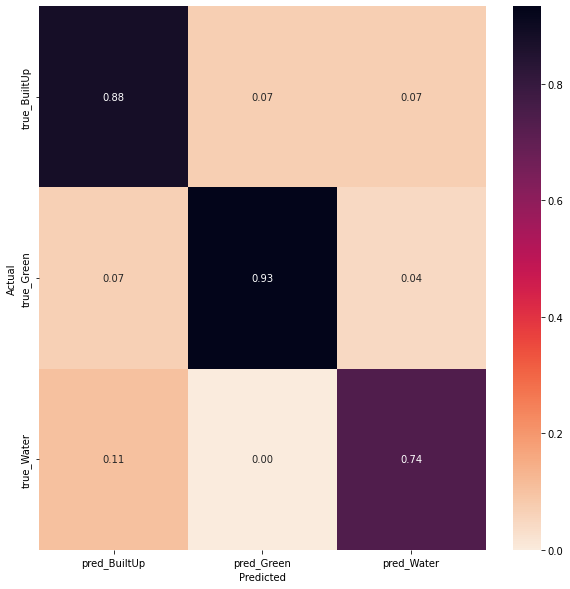

In [72]:
# compute the confusion matrix
cmn = tf.math.confusion_matrix(labels, predictions).numpy()
# normalize the matrix to be in percentages
cmn = cmn.astype('float') / cmn.sum(axis=0)[:, np.newaxis]
# make a plot for the confusion matrix
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(cmn, annot=True, fmt='.2f', 
            xticklabels=[f"pred_{c}" for c in class_Names], 
            yticklabels=[f"true_{c}" for c in class_Names],
            # cmap="Blues"
            cmap="rocket_r"
            )
plt.ylabel('Actual')
plt.xlabel('Predicted')
# plot the resulting confusion matrix
plt.savefig("confusion-matrix_b7.png")
# plt.show()

In [73]:
results= pd.DataFrame(index= ['Custom_CNN', 'EfficientNet_B0', 'EfficientNet_B1', 'EfficientNet_B3', 'EfficientNet_B7'],
                     columns= ['Accuracy', 'F1_Score', 'Kappa_Score'])
results

,Accuracy,F1_Score,Kappa_Score
Custom_CNN,NaN,NaN,NaN
EfficientNet_B0,NaN,NaN,NaN
EfficientNet_B1,NaN,NaN,NaN
EfficientNet_B3,NaN,NaN,NaN
EfficientNet_B7,NaN,NaN,NaN


In [74]:
results['Accuracy']= [94.34, 93.4, 96.22, 97.16, 88.67]
results['F1_Score']= [93.51, 92.9, 94.97, 95.86, 86.16]
results['Kappa_Score']= [0.90, 0.89, 0.93, 0.95, 0.81]
results

,Accuracy,F1_Score,Kappa_Score
Custom_CNN,94.34,93.51,0.90
EfficientNet_B0,93.40,92.90,0.89
EfficientNet_B1,96.22,94.97,0.93
EfficientNet_B3,97.16,95.86,0.95
EfficientNet_B7,88.67,86.16,0.81
